In [ ]:
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
!pip install segyio

     |████████████████████████████████| 92kB 2.4MB/s 


# Read Data

In [ ]:
filename = '/content/drive/My Drive/Public geoscience Data/Dutch F3 seismic data/Dutch Government_F3_entire_8bit seismic.segy'

In [ ]:
import segyio

with segyio.open(filename) as f:
  print('Inline range from', min(f.ilines), 'to', max(f.ilines))
  print('Crossline range from', min(f.xlines), 'to', max(f.xlines)) 
  data = segyio.tools.cube(f)
  clip_percentile = 99
  vm = np.percentile(data, clip_percentile)

  inlines = f.ilines
  crosslines = f.xlines
  twt = f.samples + 1000

f'The {clip_percentile}th percentile is {vm:.0f}; the max amplitude is {data.max():.0f}'

Inline range from 100 to 750
Crossline range from 300 to 1250


'The 99th percentile is 6517; the max amplitude is 32767'

In [ ]:
inlines[:10]

array([100, 101, 102, 103, 104, 105, 106, 107, 108, 109], dtype=int32)

In [ ]:
crosslines[:10]

array([300, 301, 302, 303, 304, 305, 306, 307, 308, 309], dtype=int32)

2D Slice

In [ ]:
# slice the data at inline 300
inline_number = 300
slices = data[(inline_number+1),:,:]
slices.shape

(951, 462)

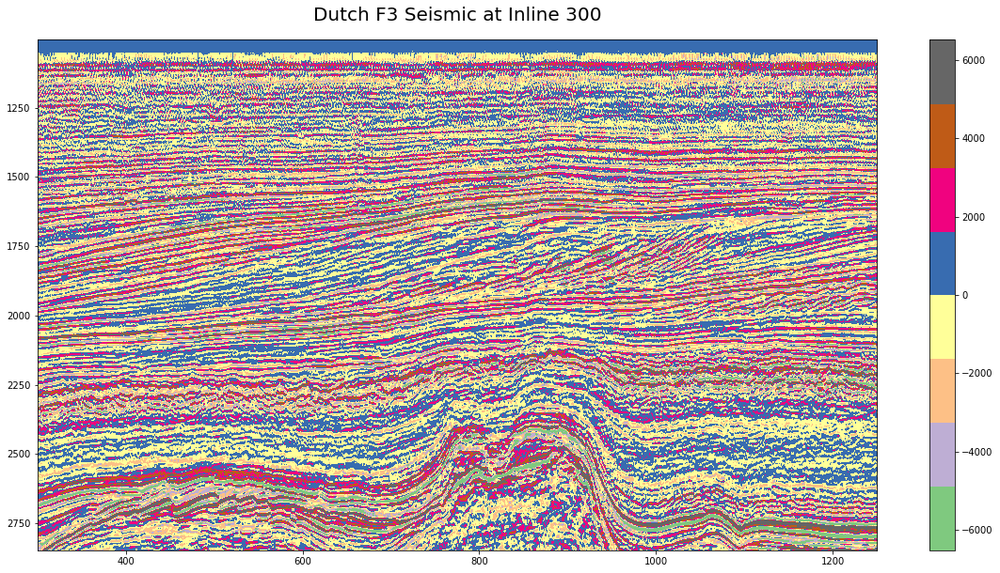

In [ ]:
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(slices.T, vmin=-vm, vmax=vm, aspect='auto', extent=extent, cmap='Accent')
plt.title('Dutch F3 Seismic at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

# Timeslice Attributes

In [ ]:
twt[:10]

array([1004., 1008., 1012., 1016., 1020., 1024., 1028., 1032., 1036.,
       1040.])

Time sample incremented by 4 ms

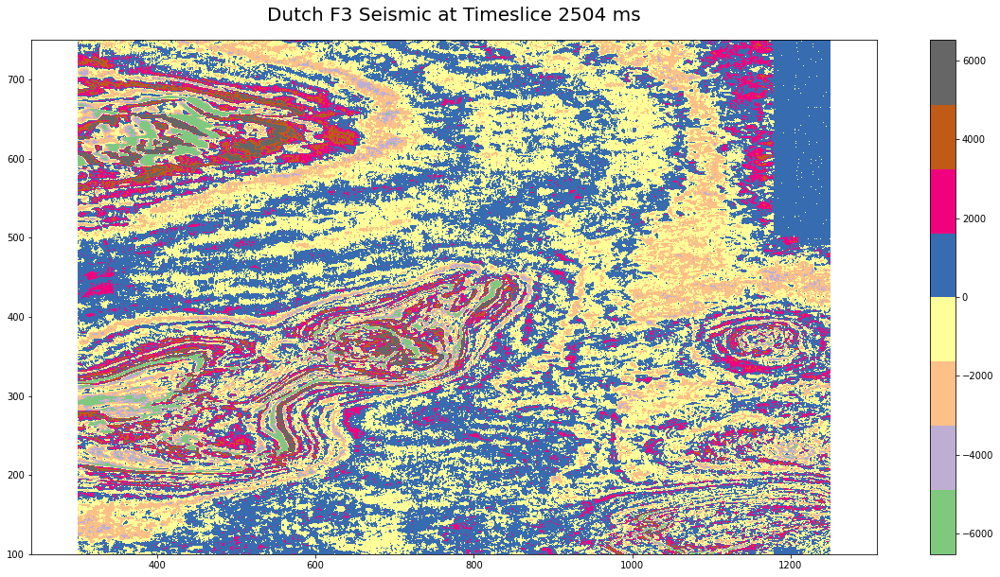

In [ ]:
# choose timeslice in ms
tslice = 2504

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(timeslice.T, vmin=-vm, vmax=vm, aspect='auto', extent=extent, cmap='Accent')
plt.title('Dutch F3 Seismic at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

### Cosine of Phase

Import attribute library.

In [ ]:
import sys
sys.path.append('/content/d2geo/attributes')

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


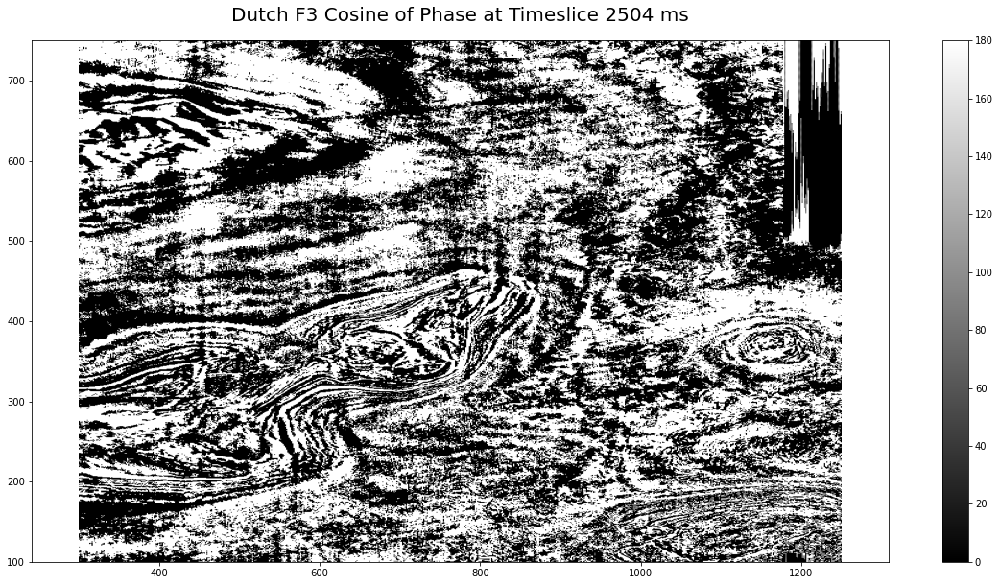

In [ ]:
# choose timeslice in ms
tslice = 2504

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

cosphase = ComplexAttributes.cosine_instantaneous_phase(y, darray.T)

trans_cosphase = cosphase.T

reshape = trans_cosphase.reshape((trans_cosphase.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Cosine of Phase at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

### Envelope

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


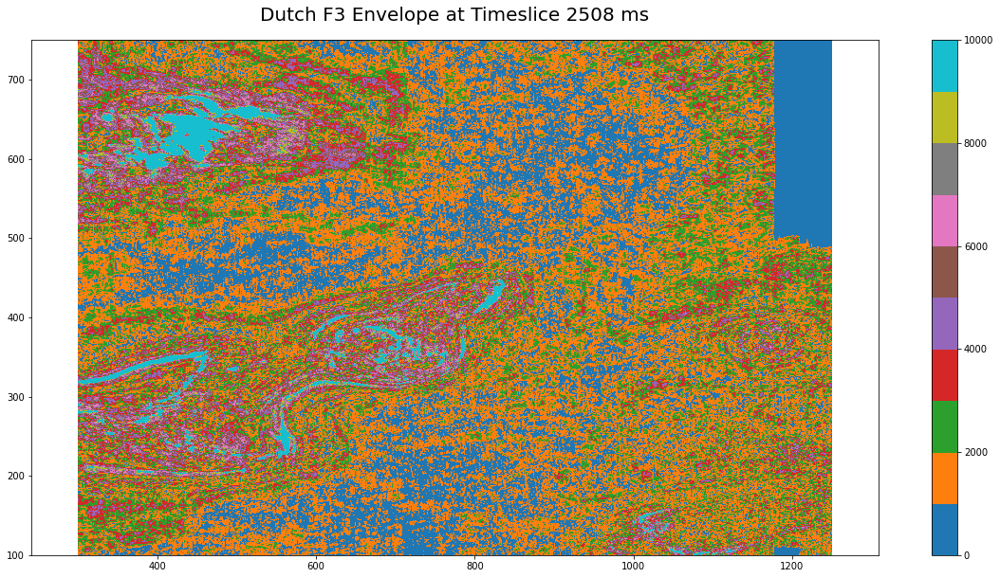

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.envelope(y, darray.T)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='tab10', vmin=0, vmax=10000)
plt.title('Dutch F3 Envelope at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

### Instantaneous Phase

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


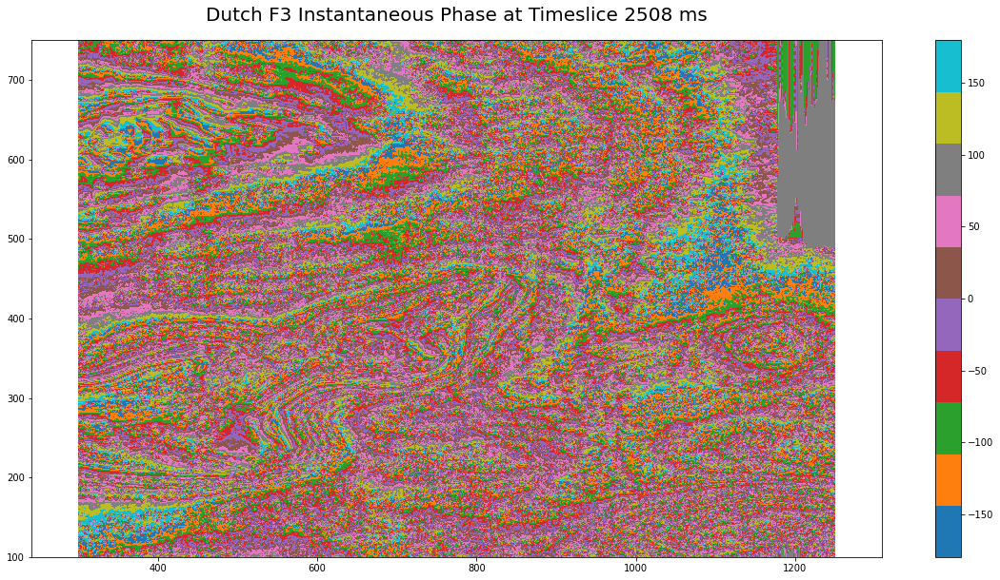

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.instantaneous_phase(y, darray.T)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='tab10', vmin=None, vmax=None)
plt.title('Dutch F3 Instantaneous Phase at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

## Relative Amplitude Contrast

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


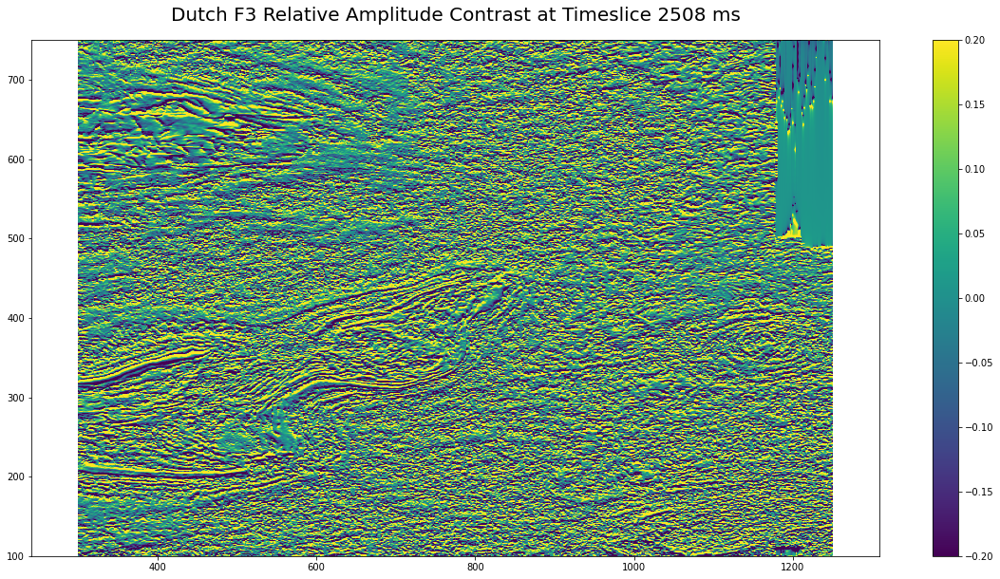

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.relative_amplitude_change(y, darray.T)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='viridis', vmin=-0.2, vmax=0.2)
plt.title('Dutch F3 Relative Amplitude Contrast at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

## Instantaneous Frequency

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


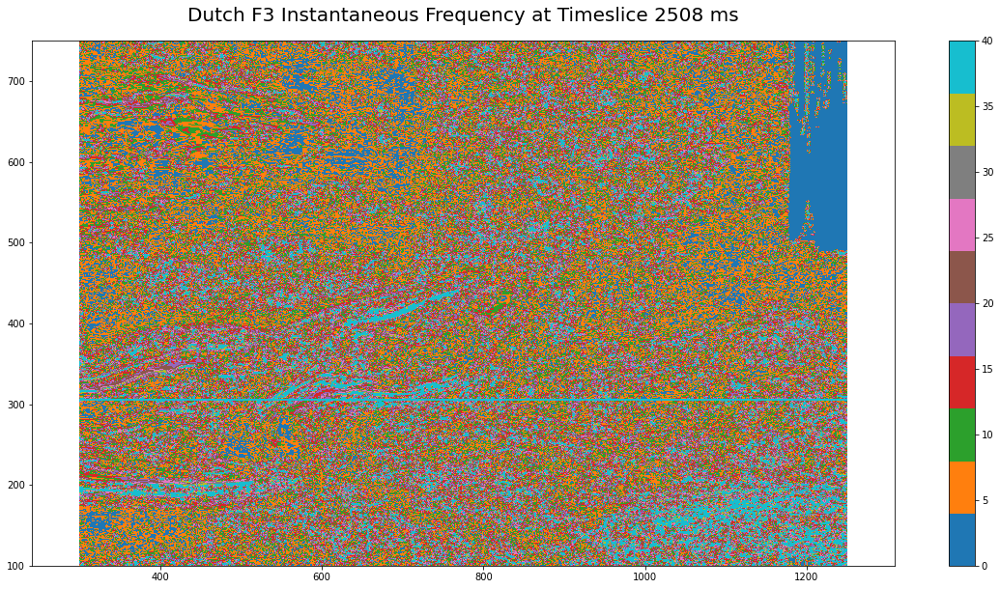

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.instantaneous_frequency(y, darray.T, sample_rate=4)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='tab10', vmin=0, vmax=40)
plt.title('Dutch F3 Instantaneous Frequency at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

## Dominant Frequency

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


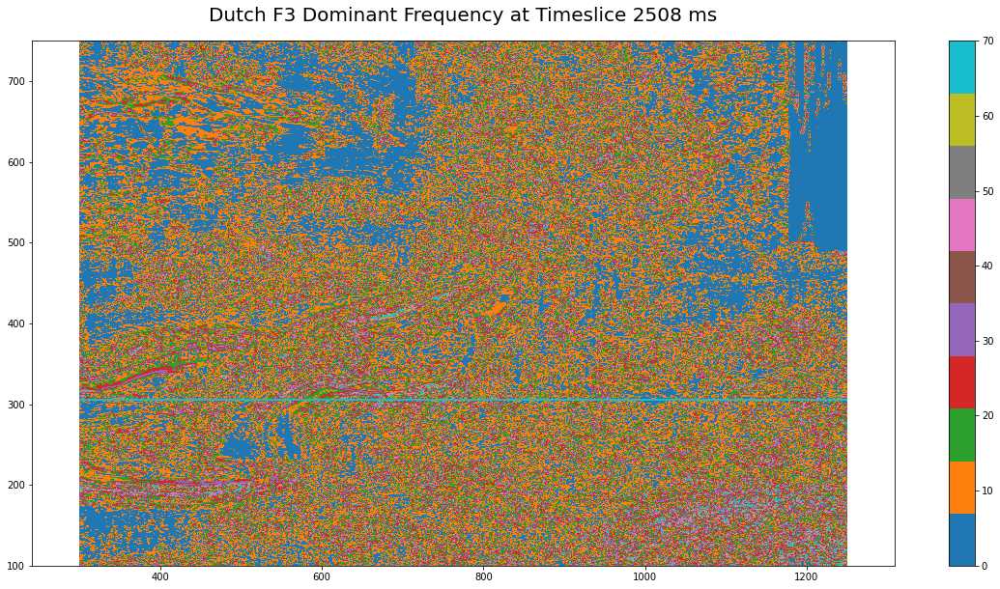

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.dominant_frequency(y, darray.T, sample_rate=4)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='tab10', vmin=0, vmax=70)
plt.title('Dutch F3 Dominant Frequency at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

## Sweetness

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


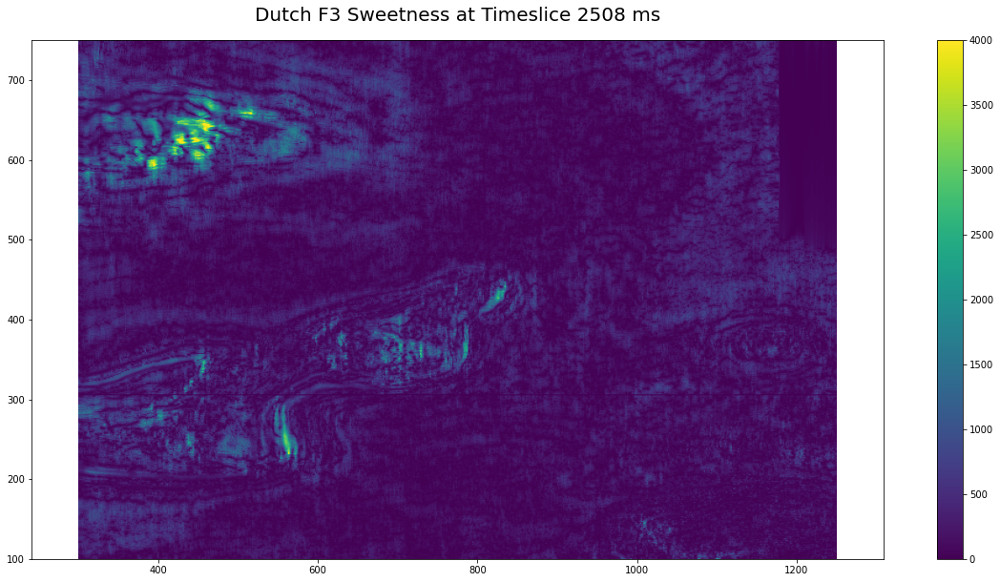

In [ ]:
# choose timeslice in ms
tslice = 2508

# find index
tslice_id = np.where(twt == tslice)[0][0]

# slicing data
timeslice = data[:,:,(tslice_id + 1)]

# reshape 2D to 3D
# timeslice = np.reshape(timeslice, timeslice.shape + (1,))
timeslice = np.reshape(np.transpose(timeslice), (np.transpose(timeslice)).shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, timeslice, kernel=None)

attribute = ComplexAttributes.sweetness(y, darray.T, sample_rate=4)

trans_attribute = attribute.T

reshape = trans_attribute.reshape((trans_attribute.shape[0], -1))

# display timeslice 
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], inlines[0], inlines[-1]]
p1 = plt.imshow(reshape, aspect='auto', extent=extent, cmap='viridis', vmin=0, vmax=4000)
plt.title('Dutch F3 Sweetness at Timeslice {} ms'.format(tslice), size=20, pad=20)
plt.colorbar(p1)
plt.axis('equal')
plt.show()

# Inline Attributes

### Cosine of Phase (Step by Step)

Shape of data

In [ ]:
data.shape

(651, 951, 462)

Slice the cube

In [ ]:
# slice the data at inline 300
slices = data[301,:,:]
slices.shape

(951, 462)

Reshape the 2D array into 3D array. Why? The Dask Array only accepts numpy in 3D form.

In [ ]:
slices = np.reshape(slices, slices.shape + (1,))
slices.shape

(951, 462, 1)

Convert to Dask Array

In [ ]:
from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)
darray

dask.array<array, shape=(951, 462, 1), dtype=float32, chunksize=(461, 461, 1), chunktype=numpy.ndarray>

In [ ]:
darray.shape

(951, 462, 1)

`darray` should be transposed, as input into the attribute function. Otherwise, can't run.

In [ ]:
cosphase = ComplexAttributes.cosine_instantaneous_phase(y, darray.T)
cosphase

dask.array<rad2deg, shape=(1, 462, 951), dtype=float32, chunksize=(1, 461, 461), chunktype=numpy.ndarray>

In [ ]:
cosphase.shape

(1, 462, 951)

In [ ]:
trans_cosphase = cosphase.T
trans_cosphase

dask.array<transpose, shape=(951, 462, 1), dtype=float32, chunksize=(461, 461, 1), chunktype=numpy.ndarray>

In [ ]:
trans_cosphase.shape

(951, 462, 1)

Reshape back from 3D to 2D

In [ ]:
reshape = trans_cosphase.reshape((trans_cosphase.shape[0], -1))
reshape

dask.array<reshape, shape=(951, 462), dtype=float32, chunksize=(461, 461), chunktype=numpy.ndarray>

In [ ]:
reshape.shape

(951, 462)

Plot imshow.

In [ ]:
plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape.T, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Cosine of Phase at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

### Cosine of Phase

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


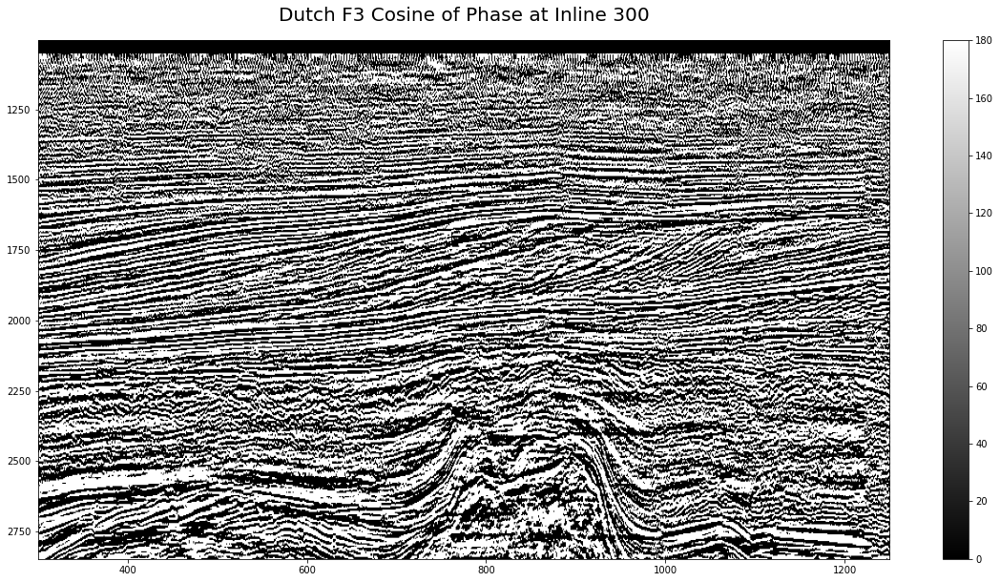

In [ ]:
# slice the data at inline 300
inline_number = 300
slices = data[(inline_number + 1),:,:]

slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

cosphase = ComplexAttributes.cosine_instantaneous_phase(y, darray.T)

trans_cosphase = cosphase.T

reshape = trans_cosphase.reshape((trans_cosphase.shape[0], -1))

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape.T, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Cosine of Phase at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

### Envelope

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


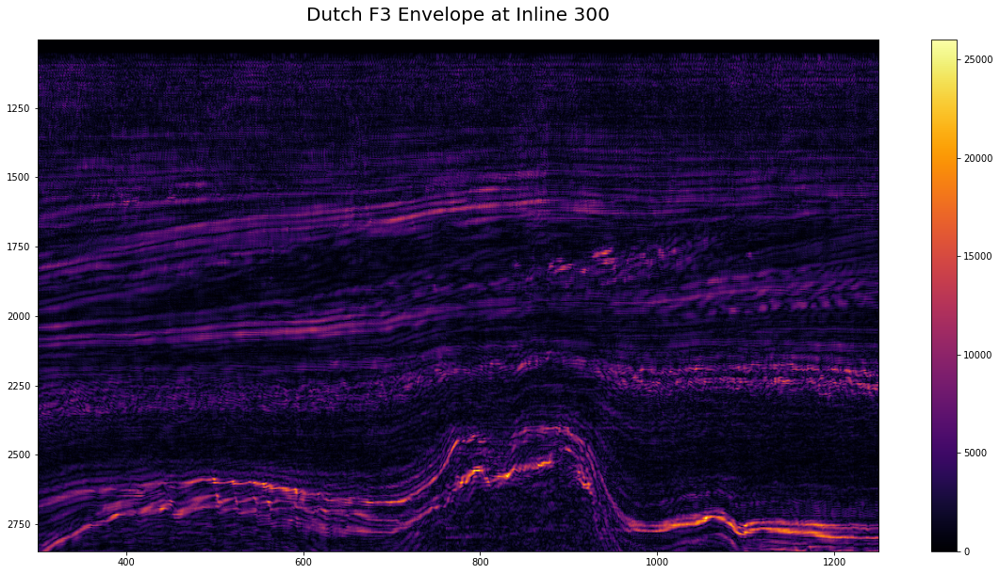

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
enve = ComplexAttributes.envelope(y, darray.T)

# transposing
trans_enve = enve.T

# reshape transpose from 2D to 3D
reshape_enve = trans_enve.reshape((trans_enve.shape[0], -1))

# plot

# clip_percentile = 99
# vm = np.percentile((reshape_enve.flatten()), clip_percentile)

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_enve.T, aspect='auto', extent=extent, cmap='inferno')
plt.title('Dutch F3 Envelope at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Instantaneous Phase

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


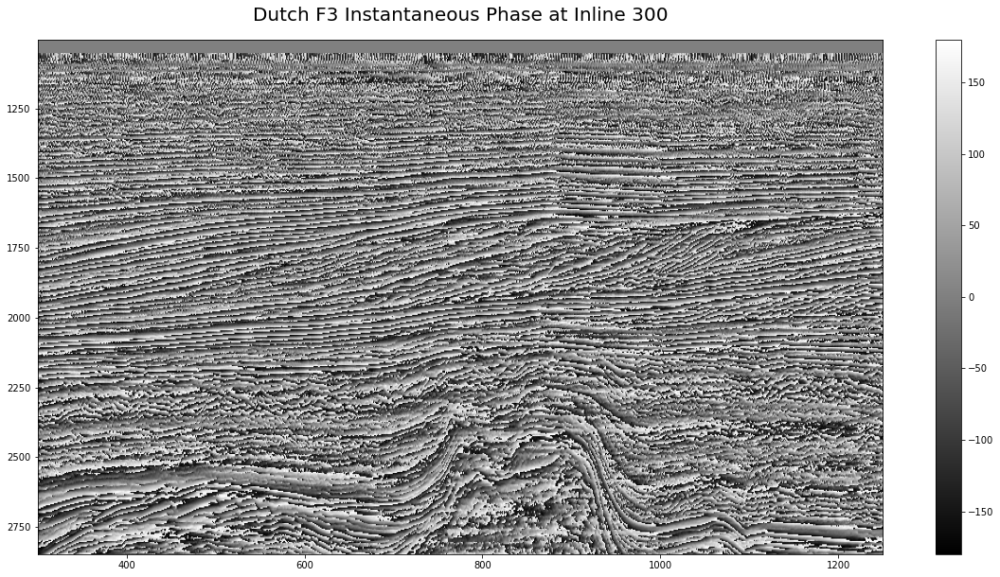

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
inphase = ComplexAttributes.instantaneous_phase(y, darray.T)

# transposing
trans_inphase = inphase.T

# reshape transpose from 2D to 3D
reshape_inphase = trans_inphase.reshape((trans_inphase.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_inphase.T, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Instantaneous Phase at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Relative Amplitude Contrast

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


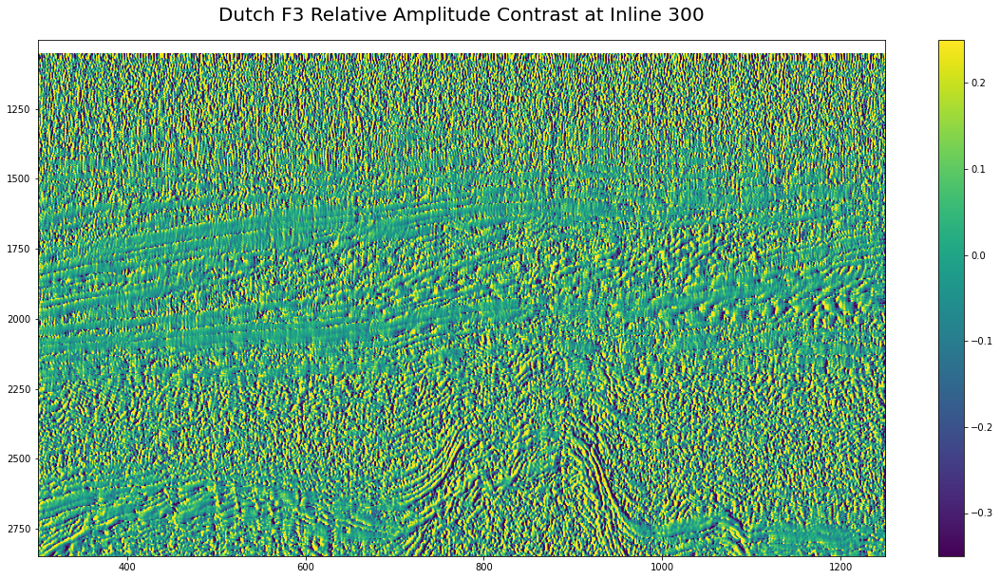

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
contrast = ComplexAttributes.relative_amplitude_change(y, darray.T)

# transposing
trans_contrast = contrast.T

# reshape transpose from 2D to 3D
reshape_contrast = trans_contrast.reshape((trans_contrast.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_contrast.T, vmin=-0.35, vmax=0.25, aspect='auto', extent=extent, cmap='viridis')
plt.title('Dutch F3 Relative Amplitude Contrast at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Instantaneous Frequency

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


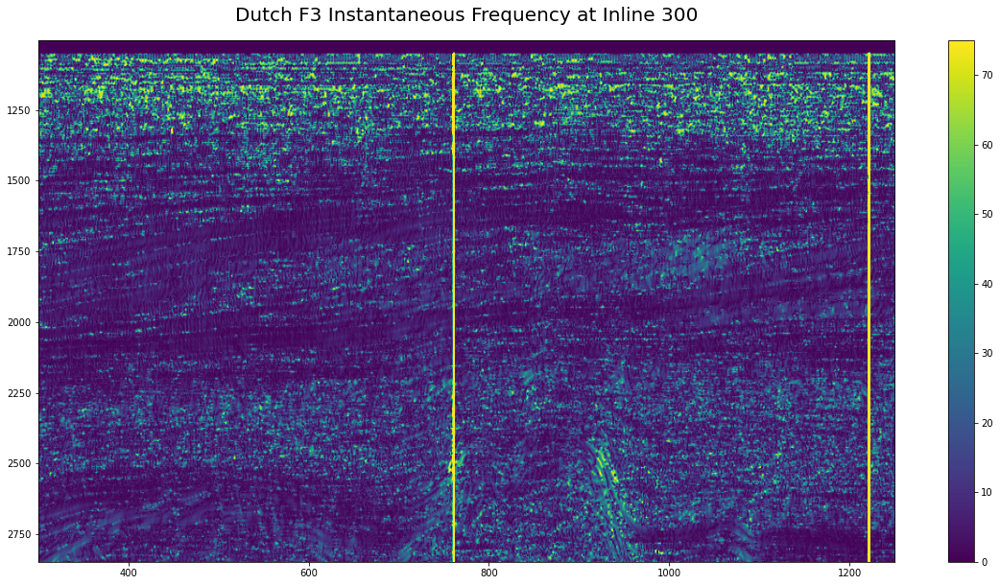

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
infreq = ComplexAttributes.instantaneous_frequency(y, darray.T, sample_rate=5)

# transposing
trans_infreq = infreq.T

# reshape transpose from 2D to 3D
reshape_infreq = trans_infreq.reshape((trans_infreq.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_infreq.T, vmin=0, vmax=75, aspect='auto', extent=extent, cmap='viridis')
plt.title('Dutch F3 Instantaneous Frequency at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Dominant Frequency

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


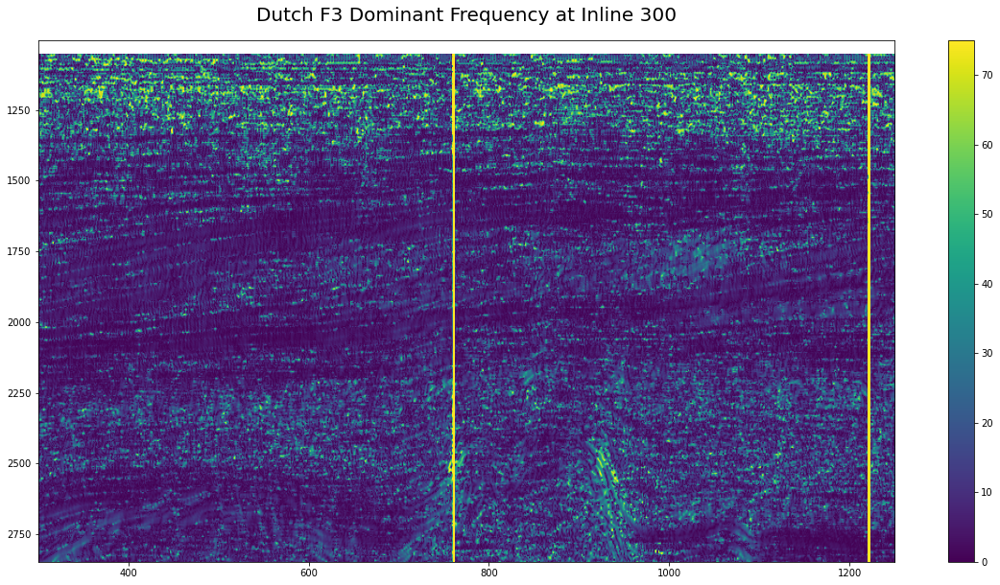

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
domfreq = ComplexAttributes.dominant_frequency(y, darray.T, sample_rate=5)

# transposing
trans_domfreq = domfreq.T

# reshape transpose from 2D to 3D
reshape_domfreq = trans_domfreq.reshape((trans_domfreq.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_domfreq.T, vmin=0, vmax=75, aspect='auto', extent=extent, cmap='viridis')
plt.title('Dutch F3 Dominant Frequency at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Sweetness

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


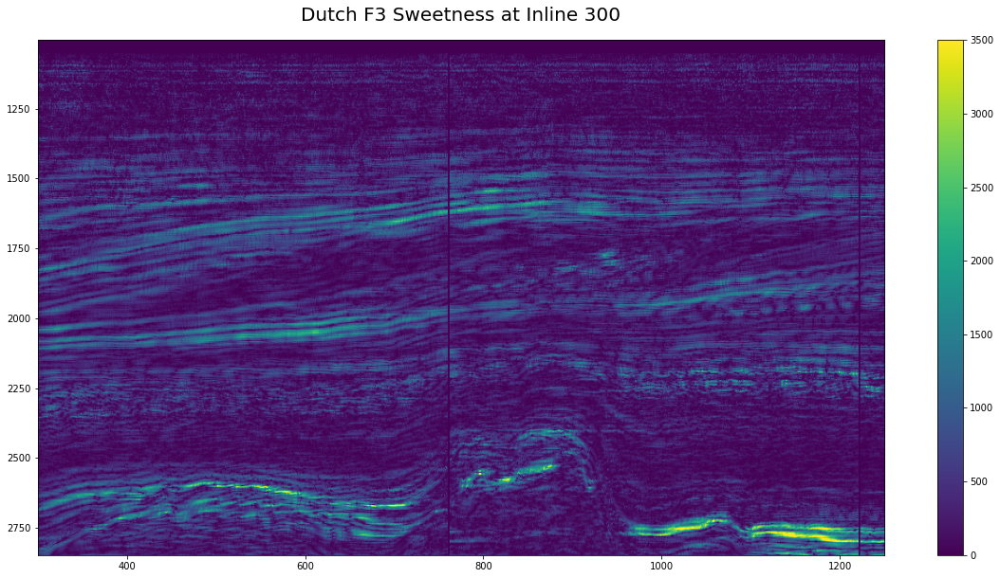

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
sweet = ComplexAttributes.sweetness(y, darray.T, sample_rate=5)

# transposing
trans_sweet = sweet.T

# reshape transpose from 2D to 3D
reshape_sweet = trans_sweet.reshape((trans_sweet.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_sweet.T, vmax=3500, aspect='auto', extent=extent, cmap='viridis')
plt.title('Dutch F3 Sweetness at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Apparent Polarity

/content/d2geo/attributes/util.py:347: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  h = h[ind]


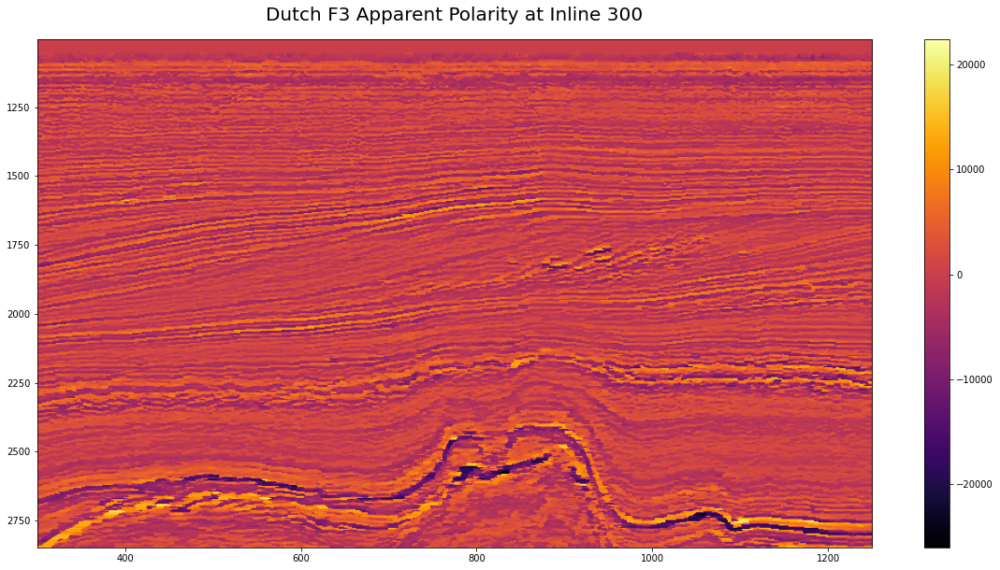

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from CompleTrace import ComplexAttributes

y = ComplexAttributes()
darray, chunks_init = ComplexAttributes.create_array(y, slices, kernel=None)

# envelope attribute
apolar = ComplexAttributes.apparent_polarity(y, darray.T)

# transposing
trans_apolar = apolar.T

# reshape transpose from 2D to 3D
reshape_apolar = trans_apolar.reshape((trans_apolar.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_apolar.T, aspect='auto', extent=extent, cmap='inferno')
plt.title('Dutch F3 Apparent Polarity at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Edge Detection: Chaos

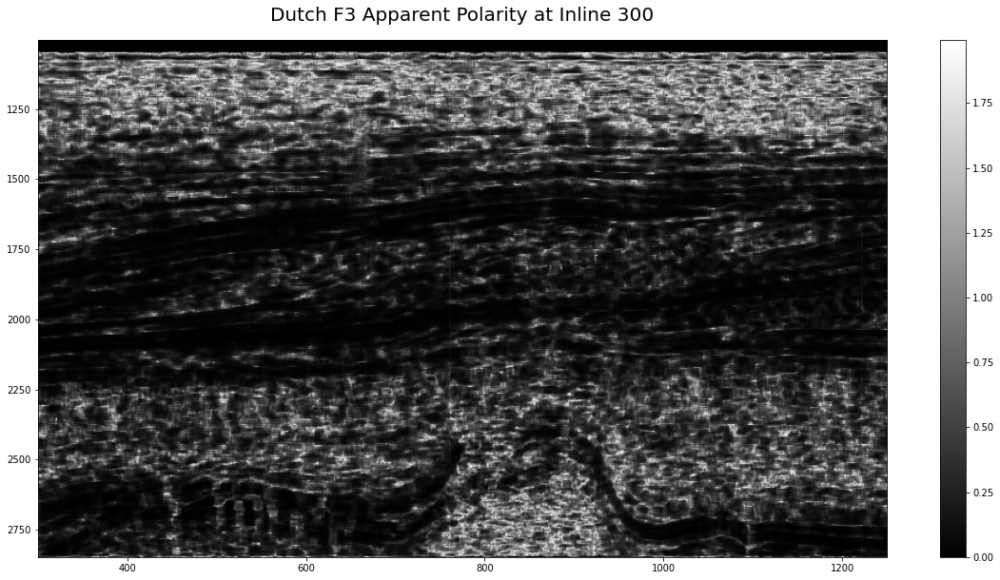

In [ ]:
# slice
inline_number = 300
slices = data[(inline_number + 1),:,:]

# reshape slice from 2D to 3D
slices = np.reshape(slices, slices.shape + (1,))

from EdgeDetection import EdgeDetection

y = EdgeDetection()
darray, chunks_init = EdgeDetection.create_array(y, slices, kernel=None, preview=None)

# envelope attribute
apolar = EdgeDetection.chaos(y, darray.T)

# transposing
trans_apolar = apolar.T

# reshape transpose from 2D to 3D
reshape_apolar = trans_apolar.reshape((trans_apolar.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_apolar.T, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Apparent Polarity at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()

## Edge Detection: Volume Curvature

Compute inline and crossline dips

In [ ]:
from DipAzm import DipAzm

dip = DipAzm()
darray, chunks_init = DipAzm.create_array(dip, slices, kernel=None, preview=None)

il_dip, xl_dip = DipAzm.gradient_dips(dip, darray.T)

In [ ]:
il_dip

dask.array<_trim, shape=(1, 462, 951), dtype=float32, chunksize=(1, 461, 461), chunktype=numpy.ndarray>

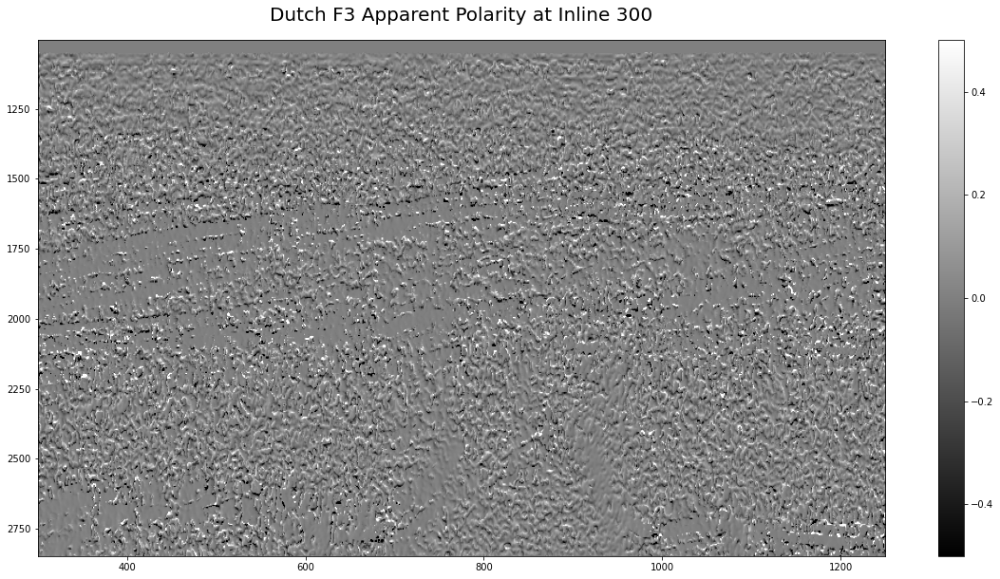

In [ ]:
apolar = EdgeDetection.volume_curvature(dip, il_dip, xl_dip)

# transposing
trans_apolar = apolar[0].T

# reshape transpose from 2D to 3D
reshape_apolar = trans_apolar.reshape((trans_apolar.shape[0], -1))

# plot

plt.figure(figsize=(20,10))
extent = [crosslines[0], crosslines[-1], twt[-1], twt[0]]
p1 = plt.imshow(reshape_apolar.T, vmin=-0.5, vmax=0.5, aspect='auto', extent=extent, cmap='gray')
plt.title('Dutch F3 Apparent Polarity at Inline {}'.format(inline_number), size=20, pad=20)
plt.colorbar(p1)
plt.show()